
# 🩺💊Chest X-ray Images

This notebook will be a workflow for a chest X-Ray image pneumonia prediciton.

More details:https://www.kaggle.com/paultimothymooney/chest-xray-pneumonia/tasks

I'm going to follow these steps:

1. Problem definition
2. Data
3. Evaluation
4. Features
5. Modelling
6. Experimenting



## 1. Problem definition

Basically, an image of a chest X-Ray will be given. We should predict if the lungs in the image suffer of pneumonia or not and if so, what's the cause (bacterial/viral).

## 2. Data 

Our dataset is form Kaggle: https://www.kaggle.com/paultimothymooney/chest-xray-pneumonia

The dataset contains 3 folders (train, test, val) and contains subfolders for each image category (Pneumonia/Normal). There are 5,863 X-Ray images (JPEG) and 2 categories (Pneumonia/Normal).

**Note:** Chest X-ray images (anterior-posterior) were selected from retrospective cohorts of pediatric patients of one to five years old.

## 3. Evaluation

For each image in the test set, you must predict a probability for each of the different kinds of chest X-Ray images(normal/bacterial pneumonia/viral pneumonia).

## 4. Features
* We're dealing with images (unstructured data) so it's probably best to use deep learning/transfer learning.
* There are 3 different classes - normal, bacterial pneumonia, viral pnumonia.
* There are 5000+ images in the train dataset, 16 images in the validation data set. These images have labels.
* There are 600+ images in the test dataset - these contain normally no labels, but because we're not doctors these also contain labels but just for our evaluation.

## 5. Modelling
### Workflow
0. Setting up the workspace
1. Get data ready
2. Pick a model (to suit our problem)
3. Fit the model into the data and make predictions
4. Evaluate the model
5. Improve through experimenation
6. Save and reload your model

#### 0. Setting up the workspace

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Check for GPU

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TensorFlow version: ", tf.__version__)

# Import TensorFlow Hub
import tensorflow_hub as hub
print("TensorFlow Hub version: ", hub.__version__)

# Check for GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TensorFlow version:  2.3.0
TensorFlow Hub version:  0.9.0
GPU available


#### 1. Getting our data ready (Turning into Tensors)
So, our data doesn't have a label file, what we're gonna do for the train data set, normal lungs is going through all the images.

In [ ]:
import glob
def filePaths(path): 
  """
  Returns path to files with a .jpeg extension from the training dataset folder.
  """
  return [file.replace('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray', '') for file in glob.glob(path + '*.jpeg')]
fileNames = filePaths('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray/train/NORMAL/')

fileNames[:10]

['/train/NORMAL/NORMAL2-IM-0820-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0821-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0822-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0824-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0825-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0826-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0827-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0828-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0829-0001.jpeg',
 '/train/NORMAL/NORMAL2-IM-0830-0001.jpeg']

In [ ]:
import pandas as pd
from pandas import DataFrame

dataFrame_Normal = DataFrame(fileNames, columns = ["Path"])

In [ ]:
dataFrame_Normal["Classification"] = 'normal'

In [ ]:
dataFrame_Normal[:10]

,Path,Classification
0,/train/NORMAL/NORMAL2-IM-0820-0001.jpeg,normal
1,/train/NORMAL/NORMAL2-IM-0821-0001.jpeg,normal
2,/train/NORMAL/NORMAL2-IM-0822-0001.jpeg,normal
3,/train/NORMAL/NORMAL2-IM-0824-0001.jpeg,normal
4,/train/NORMAL/NORMAL2-IM-0825-0001.jpeg,normal
5,/train/NORMAL/NORMAL2-IM-0826-0001.jpeg,normal
6,/train/NORMAL/NORMAL2-IM-0827-0001.jpeg,normal
7,/train/NORMAL/NORMAL2-IM-0828-0001.jpeg,normal
8,/train/NORMAL/NORMAL2-IM-0829-0001.jpeg,normal
9,/train/NORMAL/NORMAL2-IM-0830-0001.jpeg,normal


In [ ]:
fileNames = filePaths('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray/train/PNEUMONIA/')

dataFrame_Pneumonia = DataFrame(fileNames, columns = ["Path"])
dataFrame_Pneumonia[:10]

,Path
0,/train/PNEUMONIA/person739_virus_1361.jpeg
1,/train/PNEUMONIA/person73_bacteria_355.jpeg
2,/train/PNEUMONIA/person73_bacteria_356.jpeg
3,/train/PNEUMONIA/person73_bacteria_357.jpeg
4,/train/PNEUMONIA/person73_bacteria_358.jpeg
5,/train/PNEUMONIA/person73_bacteria_359.jpeg
6,/train/PNEUMONIA/person73_bacteria_360.jpeg
7,/train/PNEUMONIA/person740_bacteria_2643.jpeg
8,/train/PNEUMONIA/person740_virus_1362.jpeg
9,/train/PNEUMONIA/person740_virus_1363.jpeg


In [ ]:
def get_labels_for_pneumonia_images(filePaths = []):
  """
  This function will determine for each image its label (virus/bacteria) and return it as a list.
  """
  labels = []
  for item in filePaths:
    if item.find("virus") >=0:
      labels.append("virus")
    else:
      labels.append("bacteria")
  return labels



In [ ]:
dataFrame_Pneumonia = DataFrame(fileNames, columns = ["Path"])
dataFrame_Pneumonia["Classification"] = get_labels_for_pneumonia_images(dataFrame_Pneumonia['Path'])
dataFrame_Pneumonia[20:30]

,Path,Classification
20,/train/PNEUMONIA/person746_virus_1369.jpeg,virus
21,/train/PNEUMONIA/person747_bacteria_2650.jpeg,bacteria
22,/train/PNEUMONIA/person747_virus_1370.jpeg,virus
23,/train/PNEUMONIA/person747_virus_1372.jpeg,virus
24,/train/PNEUMONIA/person748_virus_1373.jpeg,virus
25,/train/PNEUMONIA/person749_bacteria_2652.jpeg,bacteria
26,/train/PNEUMONIA/person749_virus_1374.jpeg,virus
27,/train/PNEUMONIA/person74_bacteria_361.jpeg,bacteria
28,/train/PNEUMONIA/person74_bacteria_362.jpeg,bacteria
29,/train/PNEUMONIA/person74_bacteria_363.jpeg,bacteria


In [ ]:
#merge_dataFrames = [dataFrame_Normal, dataFrame_Pneumonia]
dataFrame = dataFrame_Normal.append(dataFrame_Pneumonia, ignore_index = True)

In [ ]:
dataFrame

,Path,Classification
0,/train/NORMAL/NORMAL2-IM-0820-0001.jpeg,normal
1,/train/NORMAL/NORMAL2-IM-0821-0001.jpeg,normal
2,/train/NORMAL/NORMAL2-IM-0822-0001.jpeg,normal
3,/train/NORMAL/NORMAL2-IM-0824-0001.jpeg,normal
4,/train/NORMAL/NORMAL2-IM-0825-0001.jpeg,normal
...,...,...
5211,/train/PNEUMONIA/person1107_virus_1831.jpeg,virus
5212,/train/PNEUMONIA/person1107_virus_1832.jpeg,virus
5213,/train/PNEUMONIA/person1108_bacteria_3049.jpeg,bacteria
5214,/train/PNEUMONIA/person1109_bacteria_3050.jpeg,bacteria


In [ ]:
dataFrame[::-1]

,Path,Classification
5215,/train/PNEUMONIA/person1108_virus_1833.jpeg,virus
5214,/train/PNEUMONIA/person1109_bacteria_3050.jpeg,bacteria
5213,/train/PNEUMONIA/person1108_bacteria_3049.jpeg,bacteria
5212,/train/PNEUMONIA/person1107_virus_1832.jpeg,virus
5211,/train/PNEUMONIA/person1107_virus_1831.jpeg,virus
...,...,...
4,/train/NORMAL/NORMAL2-IM-0825-0001.jpeg,normal
3,/train/NORMAL/NORMAL2-IM-0824-0001.jpeg,normal
2,/train/NORMAL/NORMAL2-IM-0822-0001.jpeg,normal
1,/train/NORMAL/NORMAL2-IM-0821-0001.jpeg,normal


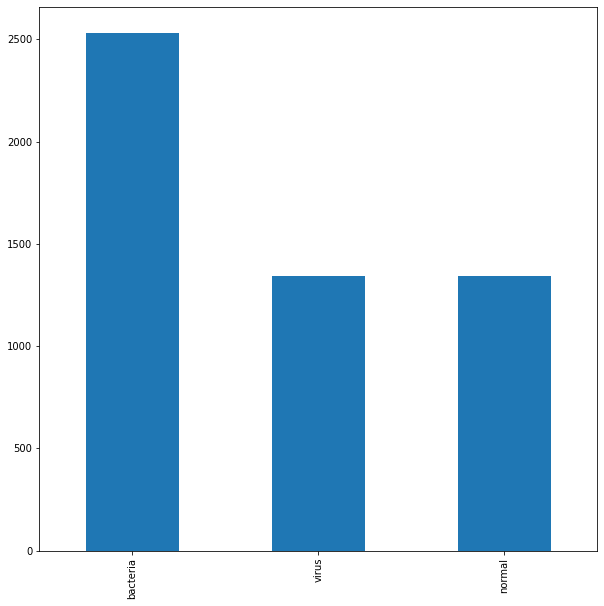

In [ ]:
import matplotlib.pyplot as plt
dataFrame["Classification"].value_counts().plot.bar(figsize = (10, 10));

In [ ]:
# Let's shuffle the data a little
from sklearn.utils import shuffle

dataFrame = shuffle(dataFrame)

In [ ]:
dataFrame[:20]

,Path,Classification
504,/train/NORMAL/IM-0629-0001-0003.jpeg,normal
2312,/train/PNEUMONIA/person45_bacteria_222.jpeg,bacteria
3711,/train/PNEUMONIA/person1544_bacteria_4033.jpeg,bacteria
1644,/train/PNEUMONIA/person918_bacteria_2843.jpeg,bacteria
4034,/train/PNEUMONIA/person1758_bacteria_4600.jpeg,bacteria
501,/train/NORMAL/IM-0628-0001.jpeg,normal
1093,/train/NORMAL/IM-0359-0001.jpeg,normal
5192,/train/PNEUMONIA/person1097_virus_1817.jpeg,virus
4031,/train/PNEUMONIA/person1753_bacteria_4594.jpeg,bacteria
2074,/train/PNEUMONIA/person644_bacteria_2536.jpeg,bacteria


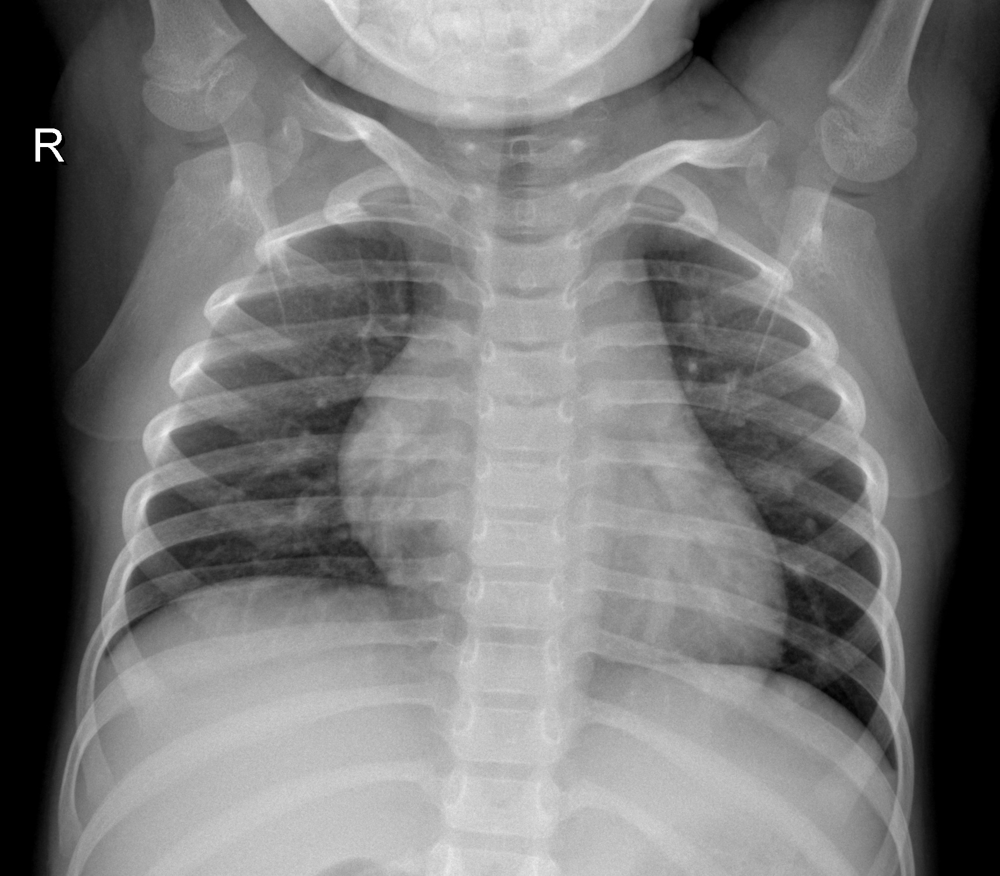

In [ ]:
from IPython.display import Image
Image("/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray"+dataFrame['Path'][4])

In [ ]:
dataFrame['Classification'][4]

'normal'

In [ ]:
import numpy as np
labels = np.array(dataFrame['Classification'])

In [ ]:
labels

array(['normal', 'bacteria', 'bacteria', ..., 'virus', 'normal', 'virus'],
      dtype=object)

In [ ]:
classification = np.unique(labels)
classification

array(['bacteria', 'normal', 'virus'], dtype=object)

In [ ]:
boolean_labels = [label == classification for label in labels]
boolean_labels[:4]

[array([False,  True, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False])]

In [ ]:
print(boolean_labels[0].astype(int))

[0 1 0]


### Prepare also the validation set

We're gonna use the same method as above to transform the validation dataset into a data frame then transform it into the iconic variables `X_train, y _train, X_val, y_val`.

In [ ]:
fileNames = filePaths('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray/val/NORMAL/')

fileNames[:10]

['/val/NORMAL/NORMAL2-IM-1427-0001.jpeg',
 '/val/NORMAL/NORMAL2-IM-1430-0001.jpeg',
 '/val/NORMAL/NORMAL2-IM-1431-0001.jpeg',
 '/val/NORMAL/NORMAL2-IM-1436-0001.jpeg',
 '/val/NORMAL/NORMAL2-IM-1437-0001.jpeg',
 '/val/NORMAL/NORMAL2-IM-1438-0001.jpeg',
 '/val/NORMAL/NORMAL2-IM-1440-0001.jpeg',
 '/val/NORMAL/NORMAL2-IM-1442-0001.jpeg']

In [ ]:
dataFrame_val_Normal = DataFrame(fileNames, columns = ['Path'])
dataFrame_val_Normal['Classification'] = 'normal'
dataFrame_val_Normal

,Path,Classification
0,/val/NORMAL/NORMAL2-IM-1427-0001.jpeg,normal
1,/val/NORMAL/NORMAL2-IM-1430-0001.jpeg,normal
2,/val/NORMAL/NORMAL2-IM-1431-0001.jpeg,normal
3,/val/NORMAL/NORMAL2-IM-1436-0001.jpeg,normal
4,/val/NORMAL/NORMAL2-IM-1437-0001.jpeg,normal
5,/val/NORMAL/NORMAL2-IM-1438-0001.jpeg,normal
6,/val/NORMAL/NORMAL2-IM-1440-0001.jpeg,normal
7,/val/NORMAL/NORMAL2-IM-1442-0001.jpeg,normal


In [ ]:
fileNames = filePaths('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray/val/PNEUMONIA/')

fileNames[:10]

['/val/PNEUMONIA/person1946_bacteria_4874.jpeg',
 '/val/PNEUMONIA/person1946_bacteria_4875.jpeg',
 '/val/PNEUMONIA/person1947_bacteria_4876.jpeg',
 '/val/PNEUMONIA/person1949_bacteria_4880.jpeg',
 '/val/PNEUMONIA/person1950_bacteria_4881.jpeg',
 '/val/PNEUMONIA/person1951_bacteria_4882.jpeg',
 '/val/PNEUMONIA/person1952_bacteria_4883.jpeg',
 '/val/PNEUMONIA/person1954_bacteria_4886.jpeg']

In [ ]:
dataFrame_val_Pneumonia = DataFrame(fileNames, columns = ["Path"])
dataFrame_val_Pneumonia["Classification"] = get_labels_for_pneumonia_images(dataFrame_val_Pneumonia['Path'])
dataFrame_val_Pneumonia

,Path,Classification
0,/val/PNEUMONIA/person1946_bacteria_4874.jpeg,bacteria
1,/val/PNEUMONIA/person1946_bacteria_4875.jpeg,bacteria
2,/val/PNEUMONIA/person1947_bacteria_4876.jpeg,bacteria
3,/val/PNEUMONIA/person1949_bacteria_4880.jpeg,bacteria
4,/val/PNEUMONIA/person1950_bacteria_4881.jpeg,bacteria
5,/val/PNEUMONIA/person1951_bacteria_4882.jpeg,bacteria
6,/val/PNEUMONIA/person1952_bacteria_4883.jpeg,bacteria
7,/val/PNEUMONIA/person1954_bacteria_4886.jpeg,bacteria


In [ ]:
dataFrame_val = dataFrame_val_Normal.append(dataFrame_val_Pneumonia, ignore_index = True)
dataFrame_val

,Path,Classification
0,/val/NORMAL/NORMAL2-IM-1427-0001.jpeg,normal
1,/val/NORMAL/NORMAL2-IM-1430-0001.jpeg,normal
2,/val/NORMAL/NORMAL2-IM-1431-0001.jpeg,normal
3,/val/NORMAL/NORMAL2-IM-1436-0001.jpeg,normal
4,/val/NORMAL/NORMAL2-IM-1437-0001.jpeg,normal
5,/val/NORMAL/NORMAL2-IM-1438-0001.jpeg,normal
6,/val/NORMAL/NORMAL2-IM-1440-0001.jpeg,normal
7,/val/NORMAL/NORMAL2-IM-1442-0001.jpeg,normal
8,/val/PNEUMONIA/person1946_bacteria_4874.jpeg,bacteria
9,/val/PNEUMONIA/person1946_bacteria_4875.jpeg,bacteria


In [ ]:
dataFrame_val = shuffle(dataFrame_val)
dataFrame_val

,Path,Classification
12,/val/PNEUMONIA/person1950_bacteria_4881.jpeg,bacteria
15,/val/PNEUMONIA/person1954_bacteria_4886.jpeg,bacteria
13,/val/PNEUMONIA/person1951_bacteria_4882.jpeg,bacteria
6,/val/NORMAL/NORMAL2-IM-1440-0001.jpeg,normal
7,/val/NORMAL/NORMAL2-IM-1442-0001.jpeg,normal
2,/val/NORMAL/NORMAL2-IM-1431-0001.jpeg,normal
9,/val/PNEUMONIA/person1946_bacteria_4875.jpeg,bacteria
5,/val/NORMAL/NORMAL2-IM-1438-0001.jpeg,normal
10,/val/PNEUMONIA/person1947_bacteria_4876.jpeg,bacteria
1,/val/NORMAL/NORMAL2-IM-1430-0001.jpeg,normal


In [ ]:
labels_val = dataFrame_val['Classification']
labels_val = np.array(labels_val)
labels_val


array(['normal', 'normal', 'normal', 'normal', 'normal', 'normal',
       'normal', 'normal', 'bacteria', 'bacteria', 'bacteria', 'bacteria',
       'bacteria', 'bacteria', 'bacteria', 'bacteria'], dtype=object)

In [ ]:
boolean_labels_val = [label == classification for label in labels_val]
boolean_labels_val

[array([False,  True, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False])]

In [ ]:
X_train = dataFrame['Path']
y_train = boolean_labels
X_val = dataFrame_val['Path']
y_val = boolean_labels_val

In [ ]:
X_train

504               /train/NORMAL/IM-0629-0001-0003.jpeg
2312       /train/PNEUMONIA/person45_bacteria_222.jpeg
3711    /train/PNEUMONIA/person1544_bacteria_4033.jpeg
1644     /train/PNEUMONIA/person918_bacteria_2843.jpeg
4034    /train/PNEUMONIA/person1758_bacteria_4600.jpeg
                             ...                      
3069         /train/PNEUMONIA/person419_virus_859.jpeg
4999    /train/PNEUMONIA/person1317_bacteria_3332.jpeg
4855       /train/PNEUMONIA/person1252_virus_2124.jpeg
518                    /train/NORMAL/IM-0640-0001.jpeg
2467        /train/PNEUMONIA/person498_virus_1007.jpeg
Name: Path, Length: 5216, dtype: object

In [ ]:
y_train[:20]

[array([False,  True, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([False, False,  True]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([False,  True, False]),
 array([False,  True, False]),
 array([False, False,  True]),
 array([ True, False, False]),
 array([False, False,  True]),
 array([ True, False, False]),
 array([False,  True, False]),
 array([False, False,  True])]

#### Preprocessing Images(Turning into Tensors)

To preprocess our images into Tensors we're going to write a function which dies a few things:
1. Takes an image filepath as input
2. Use Tensorflow to read the file and save it to a variable `image`
3. Turn our `image` into Tensor
4. Normalize our `image`(convert color channel values from 1-255 to 0-1)
5. Resize the `image` to a shape of (244, 244)
6. Return the modified `image`

In [ ]:
# Convert an image into a NumPy array
from matplotlib.pyplot import imread
image = imread('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray' +  dataFrame['Path'][42])
image.shape

(1472, 1770)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 1770), dtype=uint8, numpy=
array([[ 0, 57, 58, ..., 54, 53, 52],
       [ 1, 58, 58, ..., 56, 55, 54]], dtype=uint8)>

In [ ]:
# Define Image size
IMG_SIZE = 224

# Create a function for prepeocessing images
def preprocess_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the .jpeg image into a numerical Tensor with 3 color channels(Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize image to our desired value (224, 224)
  image = tf.image.resize(image, size = [img_size, img_size])

  return image

In [ ]:
image = preprocess_image('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray'+dataFrame['Path'][42])

In [ ]:
image.shape

TensorShape([224, 224, 3])

#### Turning our data into batches
We're dealing with a pretty large number of images, they all might not fit in one go.

That's why we're gonna go with 32 images at a time(batch size, you can manually adjust).


In order to use TensorFlow effectively, we need our dara in the form of Tensor tuples which look like this `(image, label)`.

In [ ]:
# Create a simple function to return a tuple of Tensors.
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  preprocesses the image and returns a tuple of(image, label).
  """
  image = preprocess_image(image_path)
  return image, label

In [ ]:
# Demo of the fucntion above

(preprocess_image('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray' + X_train[42]), tf.constant(y_train[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.22482495, 0.22482495, 0.22482495],
         [0.23964086, 0.23964086, 0.23964086],
         [0.25110295, 0.25110295, 0.25110295],
         ...,
         [0.27686366, 0.27686366, 0.27686366],
         [0.25177068, 0.25177068, 0.25177068],
         [0.21521325, 0.21521325, 0.21521325]],
 
        [[0.22253028, 0.22253028, 0.22253028],
         [0.24198556, 0.24198556, 0.24198556],
         [0.2654287 , 0.2654287 , 0.2654287 ],
         ...,
         [0.25941825, 0.25941825, 0.25941825],
         [0.25038636, 0.25038636, 0.25038636],
         [0.21428573, 0.21428573, 0.21428573]],
 
        [[0.21835236, 0.21835236, 0.21835236],
         [0.23615573, 0.23615573, 0.23615573],
         [0.2722339 , 0.2722339 , 0.2722339 ],
         ...,
         [0.2895843 , 0.2895843 , 0.2895843 ],
         [0.25844464, 0.25844464, 0.25844464],
         [0.19979309, 0.19979309, 0.19979309]],
 
        ...,
 
        [[0.        , 0.        

##### Now we've got our way to turn our data into tuples of Tensors in the form: `(image, label)', let's make a fucntion to turn all of our data (X & y) into batches.

In [ ]:
# Define the batch size, 32 is a good size
BATCH_SIZE = 32

# Create a function to turn our data into bastches
def create_data_batches(X,  y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image(X) and label(y) pairs.
  Also accepts test data as input(no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray' + X)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch  
  # If the data is a validation dataset
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray' + X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  # If the data is a training data set
  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant('/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/Data/unzipped-data/chest_xray'+X), 
                                              tf.constant(y)))
    # Creates (image, label) tuples
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)
  return data_batch


In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)))

##### Visualizing data batches
Our data is now in batches, however these can be a little hard to understand/comprehend, let's visualize them!


In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their label form data batch.
  """
  # Setup the figure
  plt.figure(figsize = (10, 10))
  # Loop through 25(for dispalying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(classification[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")
  


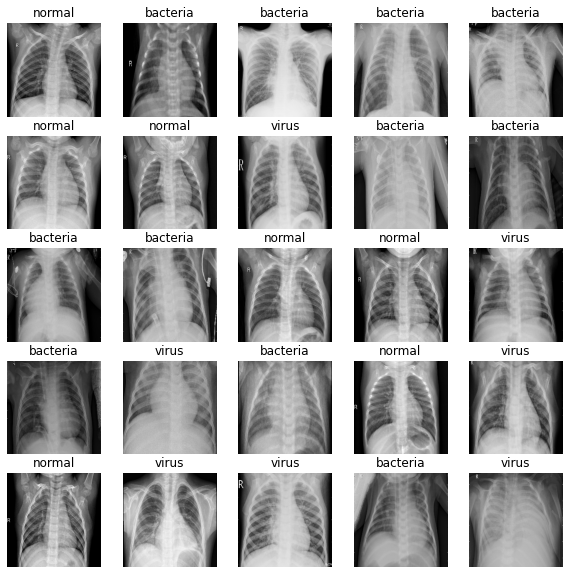

In [ ]:
# Now let's visualize them
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

#### Building a model

Before we build a model, there are a few things we need to define:
* The input shape(our images shape, in the form of Tensors) to our model.
* The output shape(image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] 

# Setup output shape of our model
OUTPUT_SHAPE = len(classification)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's out them together into Keras deep learning model!

Knowing this let's create a function which :

* Takes the input shape, output shape and the model we've chosen as paramaters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model(tells the model the input shape it'll be getting).
* Retruns the model.


All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)


  # Setup the model layers
  model = tf.keras.Sequential([
          hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
          tf.keras.layers.Dense(units = output_shape,
                                activation = 'softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_14 (KerasLayer)  (None, 1001)              5432713   
_________________________________________________________________
dense_14 (Dense)             (None, 3)                 3006      
Total params: 5,435,719
Trainable params: 3,006
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
len(classification)

3

##### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop early if a model stops improving.

We'[ll create a 2 callbacks, one for tensorBoard which helps track our models progress and another for early stopping which prevents out model from training for too long.
#### TensorFlow Callback

To setup a TensorBoard notebook we need to do 3 things:
1. Load TensorBoard notebook extension
2. Create a TensorBoard Callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboars` magic function.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
import datetime
# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/My Drive/Colab Notebooks/chest-x-ray-images/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

##### Early stopping callback
Early stopping helps stop our model form overfitting by stopping training if a certain evaluation metric stops improving..

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                   patience = 3)


#### Training a model 
Our first model is only going to train on 1000 images, to make sure everyting is working.

In [ ]:
NUM_EPOCHS = 50 #@param{type:"slider", min:50, max: 5000, step:10}

Let's create a function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for(`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Buind a fucntion to train and return a trained model
def train_model():
  """
  Trains a given model and returns a trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/80
  1/163 [..............................] - ETA: 0s - loss: 1.6111 - accuracy: 0.2500WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


163/163 [==============================] - ETA: 0s - loss: 0.5978 - accuracy: 0.7375 WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 4346s 27s/step - loss: 0.5978 - accuracy: 0.7375 - val_loss: 1.3808 - val_accuracy: 0.5625
Epoch 2/80
163/163 [==============================] - ETA: 0s - loss: 0.4789 - accuracy: 0.7937WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 408ms/step - loss: 0.4789 - accuracy: 0.7937 - val_loss: 1.3646 - val_accuracy: 0.5000
Epoch 3/80
163/163 [==============================] - ETA: 0s - loss: 0.4532 - accuracy: 0.8031WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 408ms/step - loss: 0.4532 - accuracy: 0.8031 - val_loss: 1.3358 - val_accuracy: 0.4375
Epoch 4/80
163/163 [==============================] - ETA: 0s - loss: 0.4375 - accuracy: 0.8102WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 408ms/step - loss: 0.4375 - accuracy: 0.8102 - val_loss: 1.3159 - val_accuracy: 0.4375
Epoch 5/80
163/163 [==============================] - ETA: 0s - loss: 0.4263 - accuracy: 0.8146WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 408ms/step - loss: 0.4263 - accuracy: 0.8146 - val_loss: 1.3044 - val_accuracy: 0.4375
Epoch 6/80
163/163 [==============================] - ETA: 0s - loss: 0.4175 - accuracy: 0.8184WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 407ms/step - loss: 0.4175 - accuracy: 0.8184 - val_loss: 1.2987 - val_accuracy: 0.4375
Epoch 7/80
163/163 [==============================] - ETA: 0s - loss: 0.4103 - accuracy: 0.8225WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.4103 - accuracy: 0.8225 - val_loss: 1.2968 - val_accuracy: 0.4375
Epoch 8/80
163/163 [==============================] - ETA: 0s - loss: 0.4043 - accuracy: 0.8230WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 409ms/step - loss: 0.4043 - accuracy: 0.8230 - val_loss: 1.2972 - val_accuracy: 0.4375
Epoch 9/80
163/163 [==============================] - ETA: 0s - loss: 0.3991 - accuracy: 0.8246WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 408ms/step - loss: 0.3991 - accuracy: 0.8246 - val_loss: 1.2992 - val_accuracy: 0.4375
Epoch 10/80
163/163 [==============================] - ETA: 0s - loss: 0.3945 - accuracy: 0.8269WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 408ms/step - loss: 0.3945 - accuracy: 0.8269 - val_loss: 1.3019 - val_accuracy: 0.4375
Epoch 11/80
163/163 [==============================] - ETA: 0s - loss: 0.3903 - accuracy: 0.8284WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 409ms/step - loss: 0.3903 - accuracy: 0.8284 - val_loss: 1.3049 - val_accuracy: 0.4375
Epoch 12/80
163/163 [==============================] - ETA: 0s - loss: 0.3866 - accuracy: 0.8296WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 409ms/step - loss: 0.3866 - accuracy: 0.8296 - val_loss: 1.3080 - val_accuracy: 0.4375
Epoch 13/80
163/163 [==============================] - ETA: 0s - loss: 0.3832 - accuracy: 0.8313WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 410ms/step - loss: 0.3832 - accuracy: 0.8313 - val_loss: 1.3107 - val_accuracy: 0.4375
Epoch 14/80
163/163 [==============================] - ETA: 0s - loss: 0.3801 - accuracy: 0.8315WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 408ms/step - loss: 0.3801 - accuracy: 0.8315 - val_loss: 1.3129 - val_accuracy: 0.4375
Epoch 15/80
163/163 [==============================] - ETA: 0s - loss: 0.3772 - accuracy: 0.8332WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 408ms/step - loss: 0.3772 - accuracy: 0.8332 - val_loss: 1.3146 - val_accuracy: 0.4375
Epoch 16/80
163/163 [==============================] - ETA: 0s - loss: 0.3745 - accuracy: 0.8355WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 406ms/step - loss: 0.3745 - accuracy: 0.8355 - val_loss: 1.3156 - val_accuracy: 0.4375
Epoch 17/80
163/163 [==============================] - ETA: 0s - loss: 0.3720 - accuracy: 0.8361WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 407ms/step - loss: 0.3720 - accuracy: 0.8361 - val_loss: 1.3160 - val_accuracy: 0.4375
Epoch 18/80
163/163 [==============================] - ETA: 0s - loss: 0.3696 - accuracy: 0.8368WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3696 - accuracy: 0.8368 - val_loss: 1.3157 - val_accuracy: 0.4375
Epoch 19/80
163/163 [==============================] - ETA: 0s - loss: 0.3674 - accuracy: 0.8368WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3674 - accuracy: 0.8368 - val_loss: 1.3149 - val_accuracy: 0.4375
Epoch 20/80
163/163 [==============================] - ETA: 0s - loss: 0.3653 - accuracy: 0.8368WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3653 - accuracy: 0.8368 - val_loss: 1.3137 - val_accuracy: 0.4375
Epoch 21/80
163/163 [==============================] - ETA: 0s - loss: 0.3633 - accuracy: 0.8378WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3633 - accuracy: 0.8378 - val_loss: 1.3120 - val_accuracy: 0.4375
Epoch 22/80
163/163 [==============================] - ETA: 0s - loss: 0.3614 - accuracy: 0.8390WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 406ms/step - loss: 0.3614 - accuracy: 0.8390 - val_loss: 1.3101 - val_accuracy: 0.4375
Epoch 23/80
163/163 [==============================] - ETA: 0s - loss: 0.3595 - accuracy: 0.8401WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 407ms/step - loss: 0.3595 - accuracy: 0.8401 - val_loss: 1.3079 - val_accuracy: 0.4375
Epoch 24/80
163/163 [==============================] - ETA: 0s - loss: 0.3578 - accuracy: 0.8411WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 404ms/step - loss: 0.3578 - accuracy: 0.8411 - val_loss: 1.3056 - val_accuracy: 0.4375
Epoch 25/80
163/163 [==============================] - ETA: 0s - loss: 0.3561 - accuracy: 0.8420WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3561 - accuracy: 0.8420 - val_loss: 1.3032 - val_accuracy: 0.4375
Epoch 26/80
163/163 [==============================] - ETA: 0s - loss: 0.3545 - accuracy: 0.8424WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3545 - accuracy: 0.8424 - val_loss: 1.3007 - val_accuracy: 0.4375
Epoch 27/80
163/163 [==============================] - ETA: 0s - loss: 0.3530 - accuracy: 0.8438WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 406ms/step - loss: 0.3530 - accuracy: 0.8438 - val_loss: 1.2983 - val_accuracy: 0.4375
Epoch 28/80
163/163 [==============================] - ETA: 0s - loss: 0.3515 - accuracy: 0.8443WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3515 - accuracy: 0.8443 - val_loss: 1.2960 - val_accuracy: 0.4375
Epoch 29/80
163/163 [==============================] - ETA: 0s - loss: 0.3501 - accuracy: 0.8445WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 406ms/step - loss: 0.3501 - accuracy: 0.8445 - val_loss: 1.2936 - val_accuracy: 0.4375
Epoch 30/80
163/163 [==============================] - ETA: 0s - loss: 0.3487 - accuracy: 0.8447WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 405ms/step - loss: 0.3487 - accuracy: 0.8447 - val_loss: 1.2914 - val_accuracy: 0.4375
Epoch 31/80
163/163 [==============================] - ETA: 0s - loss: 0.3474 - accuracy: 0.8457WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 407ms/step - loss: 0.3474 - accuracy: 0.8457 - val_loss: 1.2893 - val_accuracy: 0.5000
Epoch 32/80
163/163 [==============================] - ETA: 0s - loss: 0.3461 - accuracy: 0.8455WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 406ms/step - loss: 0.3461 - accuracy: 0.8455 - val_loss: 1.2873 - val_accuracy: 0.5000
Epoch 33/80
163/163 [==============================] - ETA: 0s - loss: 0.3449 - accuracy: 0.8459WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 407ms/step - loss: 0.3449 - accuracy: 0.8459 - val_loss: 1.2855 - val_accuracy: 0.5000
Epoch 34/80
163/163 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.8462WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 67s 408ms/step - loss: 0.3437 - accuracy: 0.8462 - val_loss: 1.2838 - val_accuracy: 0.5000
Epoch 35/80
163/163 [==============================] - ETA: 0s - loss: 0.3425 - accuracy: 0.8468WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 406ms/step - loss: 0.3425 - accuracy: 0.8468 - val_loss: 1.2823 - val_accuracy: 0.5000
Epoch 36/80
163/163 [==============================] - ETA: 0s - loss: 0.3414 - accuracy: 0.8470WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 407ms/step - loss: 0.3414 - accuracy: 0.8470 - val_loss: 1.2809 - val_accuracy: 0.5000
Epoch 37/80
163/163 [==============================] - ETA: 0s - loss: 0.3403 - accuracy: 0.8478WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 404ms/step - loss: 0.3403 - accuracy: 0.8478 - val_loss: 1.2797 - val_accuracy: 0.5000
Epoch 38/80
163/163 [==============================] - ETA: 0s - loss: 0.3392 - accuracy: 0.8484WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 404ms/step - loss: 0.3392 - accuracy: 0.8484 - val_loss: 1.2786 - val_accuracy: 0.5000
Epoch 39/80
163/163 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.8485WARNING:tensorflow:Early stopping conditioned on metric `val_accuarcy` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


163/163 [==============================] - 66s 404ms/step - loss: 0.3382 - accuracy: 0.8485 - val_loss: 1.2778 - val_accuracy: 0.5625
Epoch 40/80
 66/163 [===========>..................] - ETA: 38s - loss: 0.3308 - accuracy: 0.8532

KeyboardInterrupt: ignored

#### Checking the TensorBoard logs

In [ ]:
%tensorboard --logdir /content/drive/My\ Drive/Colab\ Notebooks/chest-x-ray-images/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation dataset(not used to train)
predictions = model.predict(val_data, verbose = 1)
predictions

1/1 [==============================] - 0s 2ms/step


array([[0.01800083, 0.10950581, 0.8724933 ],
       [0.0447926 , 0.19958529, 0.75562215],
       [0.03862872, 0.07968473, 0.8816866 ],
       [0.03059218, 0.17451991, 0.7948879 ],
       [0.01475966, 0.07221629, 0.913024  ],
       [0.03379553, 0.54468566, 0.42151883],
       [0.15577649, 0.5101333 , 0.33409023],
       [0.20008945, 0.34372944, 0.45618117],
       [0.05898634, 0.17658569, 0.76442796],
       [0.05066232, 0.18194161, 0.7673961 ],
       [0.02485248, 0.8534688 , 0.12167874],
       [0.02346874, 0.7372094 , 0.23932183],
       [0.0496303 , 0.73861057, 0.21175915],
       [0.16822545, 0.56354713, 0.26822737],
       [0.00946504, 0.04590965, 0.9446253 ],
       [0.22290447, 0.08145875, 0.69563675]], dtype=float32)

In [ ]:
# First prediction
index = 10
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])} %")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {classification[np.argmax(predictions[index])]}")

[0.02485248 0.8534688  0.12167874]
Max value (probability of prediction): 0.8534687757492065 %
Sum: 1.0
Max index: 1
Predicted label: normal


In [ ]:
# Turn probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return classification[np.argmax(prediction_probabilities)]

# Get a presicted label basedon an array of prediction probabilities
pred_label = get_pred_label(predictions[10])
pred_label

'normal'

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/My Drive/Colab Notebooks/dog-vision/Data",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images

save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/My Drive/Colab Notebooks/dog-vision/Data/20200914-21271600118867-1000-images-Adam.h5...


'/content/drive/My Drive/Colab Notebooks/dog-vision/Data/20200914-21271600118867-1000-images-Adam.h5'